# Use of regression and classification to determine if a real estate property's MLS listing is over- or underpriced.

## Here we will use Houston, Texas, real estate listing data showing which properties are active for sale and which are sold or terminated. We try here to predict those terminated ones. Prior to the prediction, we will perform many cleaning steps and some feature engineering. Later we will use regression models to predict the listing price. This prediction will help to determine if a listing is over- or underpriced. Such deviation from a correct market price may later explain why the listing get sold or terminated. And to predict this deviation we will use classification methods to see if we can predict an active listing will get terminated.

In [7]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.patches import Patch
import matplotlib.patches as patches
import math
import numpy as np
from numpy import percentile
from numpy.random import seed
import os
#from path import Path
import datetime
import time
import re
import pandas as pd
from sqlalchemy import create_engine
from scipy.stats import bartlett
from scipy.stats import boxcox
from scipy.stats import jarque_bera
from scipy.stats import levene
from scipy.stats import normaltest
import scipy.stats as stats
from scipy.stats.mstats import winsorize
from scipy.stats import zscore
import seaborn as sns

In [8]:
import sklearn.datasets
from sklearn import decomposition
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score, classification_report
from sklearn.metrics import confusion_matrix
import sklearn.metrics as metrics
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error
import sklearn.metrics as metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import ElasticNet, ElasticNetCV, Lasso, LassoCV, RidgeCV, Ridge
from sklearn.metrics import roc_curve, precision_recall_curve, roc_auc_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
#from sklearn.model_selection import 
from sklearn.svm import SVC
from sklearn.utils.multiclass import unique_labels

import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

In [9]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100) 
pd.set_option('display.max_colwidth', -1) 

# Helper Functions 

In [10]:
############################################# DO NOT DELETE ############################################# 

# Help functions to gather basic descriptions
def describe(df):
    return pd.concat([df.describe().T,
                      df.mad().rename('mean abs dev'),
                      df.skew().rename('skew'),
                      df.kurt().rename('kurt'),
                      df.nunique().rename('unique')
                     ], axis=1).T

def data_type_summary(df):
    # get Object data type summary
    df_stat_object = pd.DataFrame([])
    df_stat_object = df.describe(include = ['O'])
    df_stat_object.loc['dtype'] = df.dtypes
    df_stat_object.loc['size'] = len(df)
    #df_stat_object.loc['% null'] = df.isnull().count().round(2)
    #df_stat_object.loc['% null'] = ((df0.isnull().sum()/df0.shape[0])*100).round(3)
    
    
    # get numerical data type summary
    df_stat_num = pd.DataFrame([])
    df_stat_num = df.describe(include = [np.number])
    df_stat_num.loc['dtype'] = df.dtypes
    df_stat_num.loc['size'] = len(df)
    #df_stat_object.loc['% null'] = df.isnull().count().round(2)
    df_stat_object.loc['% null'] = ((df0.isnull().sum()/df0.shape[0])*100).round(3)
    
    # get date data type summary
    df_stat_date = df.describe(include = ['datetime64']) 
    df_stat_date.loc['dtype'] = df.dtypes
    df_stat_date.loc['size'] = len(df)
    #df_stat_object.loc['% null'] = df.isnull().count().round(2)
    #df_stat_object.loc['% null'] = ((df0.isnull().sum()/df0.shape[0])*100).round(3)
    
    # Combine all
    result = pd.concat([df_stat_num, df_stat_object, df_stat_date ], axis=1, sort=False)
    return result

In [11]:
############################################# DO NOT DELETE ############################################# 

def describe_with_nulls(df):
    nan_cols = [i for i in df.columns if df[i].isnull().any()]
    # get Object data type summary
    df_stat_num = pd.DataFrame([])
    df_stat_num = df0[nan_cols].describe(include = [np.number, 'O', 'datetime64']) 
    df_stat_num.loc['dtype'] = df.dtypes
    df_stat_num.loc['size'] = len(df)
    #df_stat_num.loc['% null'] = df.isnull().count().round(2)
    df_stat_num.loc['% null'] = ((df0.isnull().sum()/df0.shape[0])*100).round(3)
    return df_stat_num

In [12]:
############################################# DO NOT DELETE ############################################# 
# Function to produce statistics from scikit learn regression estimators
def regression_results(y_true, y_pred):

    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    mean_squared_log_error=metrics.mean_squared_log_error(y_true, y_pred)
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)

    print('explained_variance: ', round(explained_variance,4))    
    print('mean_squared_log_error: ', round(mean_squared_log_error,4))
    print('r2: ', round(r2,4))
    print('MAE: ', round(mean_absolute_error,4))
    print('MSE: ', round(mse,4))
    print('RMSE: ', round(np.sqrt(mse),4))

In [13]:
############################################# DO NOT DELETE ############################################# 
# Function to move specific column to the left side for easier view
def move_to_left(df, column_name):
    df= df[ [str(column_name)] + [ col for col in df.columns if col != str(column_name) ] ]
    return df

def move_to_left_get_dup(df, column_name):
    df = df[ [str(column_name)] + [ col for col in df.columns if col != str(column_name) ] ]
    df = df[df.duplicated(str(column_name))]
    return df

# Raw data

In [14]:
df_import_cols = ['MLS Number', 'Property Type', 'Status', 'Street Number', 'Street Name', 'Unit Number', 'City/Location' \
                  , 'Zip Code', 'County', 'List Price', 'Close Price', 'Close Date', 'Area', 'Subdivision'\
                  , 'Master Planned Community', 'Market Area', 'School District', 'School Elementary', 'School Middle' \
                  , 'School High', 'Building SqFt','Price Sq Ft List', 'Price Sq Ft Sold', 'Lot Size', 'Acres' \
                  , 'Price Acre List', 'Price Acre Sales', 'Year Built', 'Bedrooms','Baths Full', 'Baths Half' \
                  , 'Baths Total', 'Room Count', 'Fireplaces Number', 'Stories', 'New Construction', 'New Construction Desc' \
                  , 'Pool Private', 'No Of Garage Cap', 'Style', 'DOM', 'CDOM', 'List Office MLSID', 'List Office Name' \
                  , 'List Agent MLSID', 'List Agent Full Name', 'Selling Office MLSID', 'Selling Office Name', 'Selling Agent MLSID' \
                  , 'Selling Agent Full Name', 'Realist Owner Name', 'Last Change Timestamp', 'List Date ']

In [18]:
path1 = "D:\\dev_data\\"
path2 = "re\\har\\raw\\"
files = os.listdir(path1+path2)

df_import = pd.DataFrame()
for f in files:
    data = pd.read_excel(path1+path2+f, sheet_name=0, header= None, skiprows=1, names=df_import_cols)
    df_import = df_import.append(data)


In [19]:
df0 = df_import.copy()
# Add a unique ID for future reference
df0['import_id'] = [i for i in range(len(df0))]

In [20]:
df0.head(2)

,MLS Number,Property Type,Status,Street Number,Street Name,Unit Number,City/Location,Zip Code,County,List Price,Close Price,Close Date,Area,Subdivision,Master Planned Community,Market Area,School District,School Elementary,School Middle,School High,Building SqFt,Price Sq Ft List,Price Sq Ft Sold,Lot Size,Acres,Price Acre List,Price Acre Sales,Year Built,Bedrooms,Baths Full,Baths Half,Baths Total,Room Count,Fireplaces Number,Stories,New Construction,New Construction Desc,Pool Private,No Of Garage Cap,Style,DOM,CDOM,List Office MLSID,List Office Name,List Agent MLSID,List Agent Full Name,Selling Office MLSID,Selling Office Name,Selling Agent MLSID,Selling Agent Full Name,Realist Owner Name,Last Change Timestamp,List Date,import_id
0,40000035,Rental,Active,12150,Old County,3,Willis,77378,Montgomery,650,NaN,NaT,19.0,LONIS GEO W,NaN,Conroe Northeast,56 - Willis,A.R. TURNER ELEMENTARY SCHOOL,ROBERT P. BRABHAM MIDDLE SCHOOL,WILLIS HIGH SCHOOL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1985.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,NaN,0.0,0.0,Other Style,69,69,JINE03,"Texas Home Group, REALTORS",MPRIEST,Michelle Priest,NaN,NaN,NaN,NaN,NaN,2020-07-03 09:55:30,2020-07-03,0
1,68543098,Rental,Active,4811,Oakland,6,Houston,77023,Harris,675,NaN,NaT,4.0,Muller Add,NaN,East End Revitalized,27 - Houston,CAGE ELEMENTARY SCHOOL,NAVARRO MIDDLE SCHOOL (HOUSTON),AUSTIN HIGH SCHOOL (HOUSTON),6716.0,0.1,NaN,10379.0,0.2383,2833.0,NaN,1952.0,1.0,1.0,0.0,1.0,3.0,NaN,2.0,0.0,NaN,0.0,0.0,NaN,70,70,RUTH01,"Ruth Longoria, REALTORS",LONGORIA,Ruth Longoria,NaN,NaN,NaN,NaN,NaN,2020-07-02 14:35:13,2020-07-02,1


In [21]:
df0.columns

Index(['MLS Number', 'Property Type', 'Status', 'Street Number', 'Street Name',
       'Unit Number', 'City/Location', 'Zip Code', 'County', 'List Price',
       'Close Price', 'Close Date', 'Area', 'Subdivision',
       'Master Planned Community', 'Market Area', 'School District',
       'School Elementary', 'School Middle', 'School High', 'Building SqFt',
       'Price Sq Ft List', 'Price Sq Ft Sold', 'Lot Size', 'Acres',
       'Price Acre List', 'Price Acre Sales', 'Year Built', 'Bedrooms',
       'Baths Full', 'Baths Half', 'Baths Total', 'Room Count',
       'Fireplaces Number', 'Stories', 'New Construction',
       'New Construction Desc', 'Pool Private', 'No Of Garage Cap', 'Style',
       'DOM', 'CDOM', 'List Office MLSID', 'List Office Name',
       'List Agent MLSID', 'List Agent Full Name', 'Selling Office MLSID',
       'Selling Office Name', 'Selling Agent MLSID', 'Selling Agent Full Name',
       'Realist Owner Name', 'Last Change Timestamp', 'List Date ',
       'import

In [22]:
# Cleanup columns headings
df0.columns = df0.columns.str.lstrip()
df0.columns = df0.columns.str.rstrip()
df0.columns = df0.columns.str.replace(' ', '_')
df0.columns = df0.columns.str.lower()
# Make the whole dataframe to lower case
df0 = df0.applymap(lambda s:s.lower() if type(s) == str else s)

In [23]:

# Extract the numerical values from string
df0['school_district_num'] = df0['school_district'].str.extract('(\d+)').astype(str)
df0['school_district_num'] = df0['school_district_num'].astype(str).astype(float) 
# Change type to date time
df0["last_change_timestamp"]  = pd.to_datetime(df0["last_change_timestamp"])
df0["list_date"]  = pd.to_datetime(df0["list_date"])
df0["close_date"]  = pd.to_datetime(df0["close_date"])
df0["year_built"]  = pd.to_datetime(df0["year_built"])
# Change currency type to float
currency_cols = ['list_price', 'close_price']
df0[currency_cols] = (df0[currency_cols].replace( '[\$,)]','', regex=True ).replace( '[(]','-',   regex=True ).astype(float))


In [24]:
# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}'.format(df_import.shape, df0.shape))

The shapes of dataset as we proceed: (36877, 53), (36877, 55)


In [25]:
# Drop columns with many missing values
df0 = df0.drop(['unit_number','close_date', 'master_planned_community','new_construction_desc','realist_owner_name','mls_number' ], axis=1)
# Drop calculated values as these can be recalcualted when we fill the missing values
df0 = df0.drop(['fireplaces_number', 'price_sq_ft_list', 'price_sq_ft_sold','price_acre_sales', 'acres', 'price_acre_list' ], axis=1)
df0 = df0.rename(columns={'city/location':'city_location'}) #, inplace=True)

# Drop these as they influence the target and are irrelevant
df0 = df0.drop(['selling_office_mlsid', 'selling_office_name', 'selling_agent_mlsid', 'selling_agent_full_name'], axis=1)

In [26]:
# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}'.format(df_import.shape, df0.shape))

The shapes of dataset as we proceed: (36877, 53), (36877, 39)


## Fill missing values

In [27]:
# Fill nulls of categorical data with a place holder instead of removing them so not to reduce the frequency of the target variable
df0['lot_size'].fillna(df0['lot_size'].median(), inplace=True)
df0['area'].fillna("value missing", inplace=True)
df0['street_number'].fillna("value missing", inplace=True)
df0['subdivision'].fillna("value missing", inplace=True)
df0['market_area'].fillna("value missing", inplace=True)
df0['school_elementary'].fillna("value missing", inplace=True)
df0['school_middle'].fillna("value missing", inplace=True)
df0['school_high'].fillna("value missing", inplace=True)
df0['room_count'].fillna(df0['room_count'].median(), inplace=True)
df0['building_sqft'].fillna(df0['building_sqft'].median(), inplace=True)


In [28]:
# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}'.format(df_import.shape, df0.shape))

The shapes of dataset as we proceed: (36877, 53), (36877, 39)


In [29]:
# Use a dict for min and max normal values for each column. Drop rows with values outside of this range 
value_range = {
    'building_sqft': (800, 5000),
    'lot_size': (3000, 30000),
    'bedrooms': (1,8),
    'baths_full': (1, 5),
    'baths_half': (0, 5),
    'baths_total': (1, 10),
    'room_count': (1, 10),
    'stories': (1,2),
    'no_of_garage_cap': (0,3),
    'dom': (0, 600),
    'cdom': (0, 600)}

def drop_extreme_rows(df):
    for c in range(0, len(list(value_range.keys()))):
        col_name = list(value_range.keys())[c]
        col_min_val = list(value_range.values())[c][0]
        col_max_val = list(value_range.values())[c][1]
        df = df[df[col_name].between(col_min_val, col_max_val)]
    return df
df0 = drop_extreme_rows(df0)

In [30]:
# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}'.format(df_import.shape, df0.shape))

The shapes of dataset as we proceed: (36877, 53), (19429, 39)


In [31]:
df1 = df0.copy()

## Feature Engineering

In [32]:
# Add Target
df1['target'] = np.where((df1.status == "expired") | (df1.status == "terminated") | (df1.status == "withdrawn"), 1,0)
# Reorder the columns so those important one are shown on the left side
df1 = df1[ ['target'] + [ col for col in df1.columns if col != 'target' ] ]
# Slice the data into more comparable property types
df1 = df1[df1['property_type']=='single-family']
print('The shapes of dataset as we proceed: {}, {}, {}'.format(df_import.shape, df0.shape, df1.shape))

The shapes of dataset as we proceed: (36877, 53), (19429, 39), (13882, 40)


In [33]:
# Add a column with ones
df1['ones'] = 1
# Create the ratio of lot size as of building size for filling the nans lalter
df1['lot_build_ratio'] = df1['lot_size'].div(df1['building_sqft'].where(df1['lot_size'] != 0, 0 ))#np.nan))
# Get the median of lot size to building size ratio
lot_build_ratio_median = df1.loc[df1['lot_build_ratio'] !='NaN', 'lot_build_ratio'].median()
df1["lot_build_ratio"] = np.where(lot_build_ratio_median =='NaN', lot_build_ratio_median, lot_build_ratio_median)
# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}, {}'.format(df_import.shape, df0.shape, df1.shape))

The shapes of dataset as we proceed: (36877, 53), (19429, 39), (13882, 42)


In [34]:
# Find the median of dates
year_built_median = df1['year_built'].astype('datetime64[ns]').quantile(.5)
list_date_median = df1['list_date'].astype('datetime64[ns]').quantile(.5)
# Fill dates with null
df1['year_built'].fillna(year_built_median, inplace=True)
df1['list_date'].fillna(list_date_median, inplace=True)
# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}, {}'.format(df_import.shape, df0.shape, df1.shape))

The shapes of dataset as we proceed: (36877, 53), (19429, 39), (13882, 42)


In [35]:
# df2 and df3 are kept unused on purpose

In [36]:
df4 = df1.copy()

In [37]:
# check to see if the unique index is duplicated. A duplication cause problem later
move_to_left_get_dup(df0, 'import_id')

,import_id,property_type,status,street_number,street_name,city_location,zip_code,county,list_price,close_price,area,subdivision,market_area,school_district,school_elementary,school_middle,school_high,building_sqft,lot_size,year_built,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,style,dom,cdom,list_office_mlsid,list_office_name,list_agent_mlsid,list_agent_full_name,last_change_timestamp,list_date,school_district_num


In [38]:
# Add price boundry
lower_bound = 200000
upper_bound = 750000
df4 = df4[((df4['list_price'] >= lower_bound) & (df4['list_price'] <=upper_bound))]

# Get a new coutnt of shape
print('The shapes of dataset as we proceed: {}, {}, {}'.format(df0.shape, df1.shape, df4.shape))

The shapes of dataset as we proceed: (19429, 39), (13882, 42), (10005, 42)


## Add rank for the target

In [39]:
# Add performance rank to identify top producers
df4['target_sum'] = df4.groupby('list_office_mlsid')['target'].transform('sum')
df4['target_rank'] = df4['target_sum'].rank(method='dense', ascending=False)

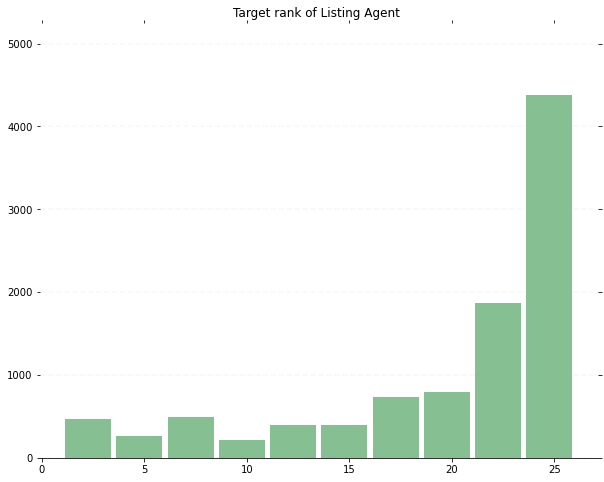

In [40]:
ax = df4.hist(column='target_rank', bins=10, grid=False, figsize=(10,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Target rank of Listing Agent ")

## See Listing Price vs. Size (Sqft)

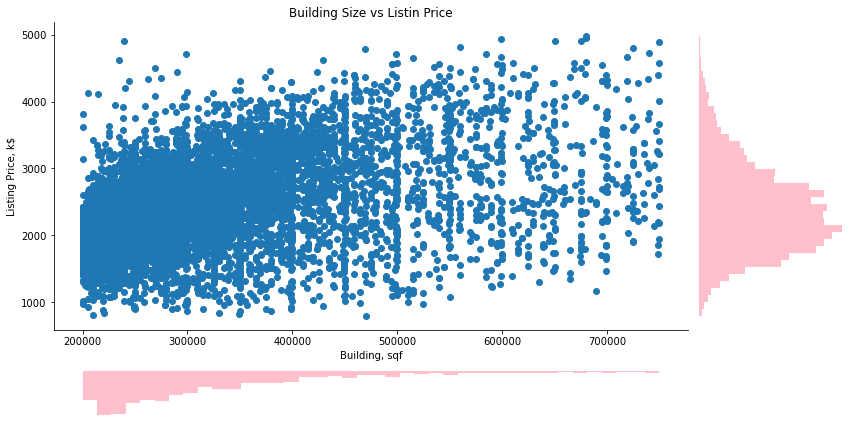

In [41]:
# prepare the data for plotting
# separate x and y
x = df4["list_price"]
y = df4["building_sqft"]

# instanciate the figure
fig = plt.figure(figsize = (12, 6))
# in this case we use gridspec.
gs = fig.add_gridspec(5, 5)
ax1 = fig.add_subplot(gs[:4, :-1])

# plot the data
# main axis: scatter plot
ax1.scatter(x, y) #, c = df4.target.astype('category').cat.codes) 

# set the labels for x and y
ax1.set_xlabel("Building, sqf")
ax1.set_ylabel("Listing Price, k$")

# set the title for the main plot
ax1.set_title("Building Size vs Listin Price")

# prettify the plot
# get rid of some of the spines to make the plot nicer
ax1.spines["right"].set_color("None")
ax1.spines["top"].set_color("None")

# using familiar slicing, get the bottom axes and plot
ax2 = fig.add_subplot(gs[4:, :-1])
ax2.hist(x, 40, orientation = 'vertical', color = "pink")

# invert the axis (it looks up side down)
ax2.invert_yaxis()

# prettify the plot
# set the ticks to null
ax2.set_xticks([])
ax2.set_yticks([])
# no axis to make plot nicer
ax2.axison = False

# using familiar slicing, get the left axes and plot
ax3 = fig.add_subplot(gs[:4, -1])
ax3.hist(y, 40, orientation = "horizontal", color = "pink")

# prettify the plot
# set the ticks to null
ax3.set_xticks([])
ax3.set_yticks([])
# no axis to make plot nicer
ax3.axison = False

# make all the figures look nicier
fig.tight_layout()


## Target vs. Building & Lot Size 

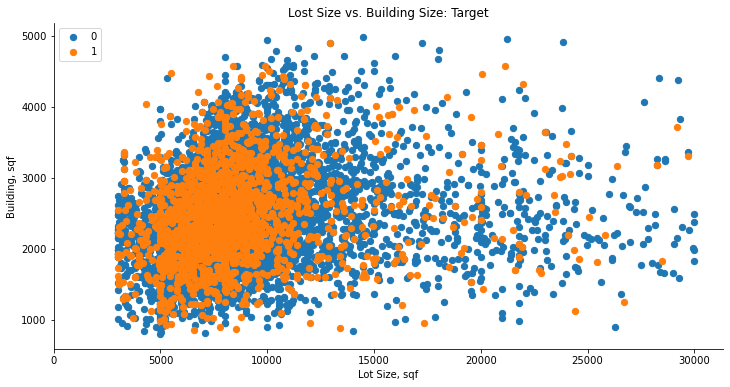

In [42]:
# instanciate the figure
fig = plt.figure(figsize = (12, 6))
ax = fig.add_subplot(1,1,1,)

# iterate over each category and plot the data. This way, every group has it's own color. Otherwise everything would be blue
for cat in sorted(list(df4["target"].unique())):
# filter x and the y for each category
    lot = df4[df4["target"] == cat]["lot_size"]
    build = df4[df4["target"] == cat]["building_sqft"]
    # plot the data
    ax.scatter(lot, build, label = cat, s = 40)
    
# prettify the plot

# eliminate 2/4 spines (lines that make the box/axes) to make it more pleasant
ax.spines["top"].set_color("None") 
ax.spines["right"].set_color("None")

# set a specific label for each axis
ax.set_xlabel("Lot Size, sqf") 
ax.set_ylabel("Building, sqf")

# change the lower limit of the plot, this will allow us to see the legend on the left
ax.set_xlim(-0.01) 
ax.set_title("Lost Size vs. Building Size: Target")
ax.legend(loc = "upper left", fontsize = 10);

## Visual of all numeric features 

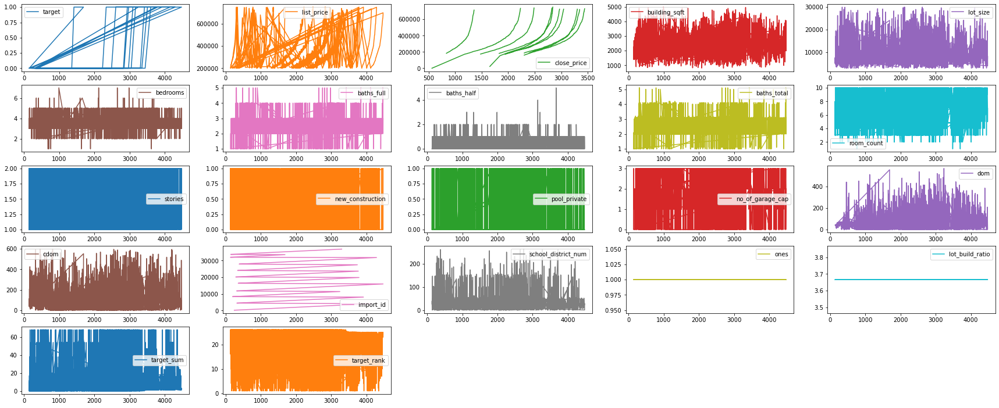

In [43]:
# Get all numerica columns
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']

df4_num = df4.select_dtypes(include=numerics)
num_cols = df4_num.columns
# Plot all of them
df4[num_cols].plot(subplots=True, layout=(8, 5), figsize=(30, 20), sharex=False);

## Study outliers 

## List Price vs Close Price: Size, Mean, Median, Max and Min

In [44]:
pivot1 = pd.pivot_table(df4,index=["target"],values=["list_price", "close_price"], aggfunc=[len, np.mean, np.median, np.max, np.min], margins=True).round(0)

# function to pivot showing in 1000$
def format(x):
        return "${:.1f}K".format(x/1000)

# Apply function to specifc columns

lst = pivot1.columns[2:10]
for l in lst:
    pivot1[l] = pivot1[l].apply(format)
pivot1

len                   mean                 median             \
       close_price list_price close_price list_price close_price list_price   
target                                                                        
0       8140.0      8140.0     $302.4K     $313.7K    $272.5K     $280.0K     
1       1865.0      1865.0     $nanK       $328.5K    $nanK       $292.1K     
All     5202.0      5202.0     $302.4K     $308.7K    $272.5K     $277.0K     

              amax                   amin             
       close_price list_price close_price list_price  
target                                                
0       $750.0K     $750.0K    $0.2K       $200.0K    
1       $nanK       $749.9K    $nanK       $200.0K    
All     $750.0K     $750.0K    $0.2K       $200.0K

## Building size vs List Price: Size, Mean, Median, Max and Min

In [45]:
#pivot_df = df0.loc[df0['property_type'].isin(['single-family', 'townhouse/condo', 'mid/hi-rise condo'])]
pivot2 = pd.pivot_table(df4,index=["target"],values=["building_sqft", "list_price"], aggfunc=[len, np.mean, np.median, np.max, np.min], margins=True).round(0)

# function to pivot showing in 1000$
def format(x):
        return "{:.1f}K".format(x/1000)

# Apply function to specifc columns

lst = pivot2.columns[2:10]
for l in lst:
    pivot2[l] = pivot2[l].apply(format)
pivot2

len                     mean                   median  \
       building_sqft list_price building_sqft list_price building_sqft   
target                                                                   
0       8140.0        8140.0     2.4K          313.7K     2.3K           
1       1865.0        1865.0     2.4K          328.5K     2.4K           
All     10005.0       10005.0    2.4K          316.5K     2.3K           

                           amax                     amin             
       list_price building_sqft list_price building_sqft list_price  
target                                                               
0       280.0K     5.0K          750.0K     0.8K          200.0K     
1       292.1K     4.9K          749.9K     0.9K          200.0K     
All     283.3K     5.0K          750.0K     0.8K          200.0K

## Explore and fix any outliers

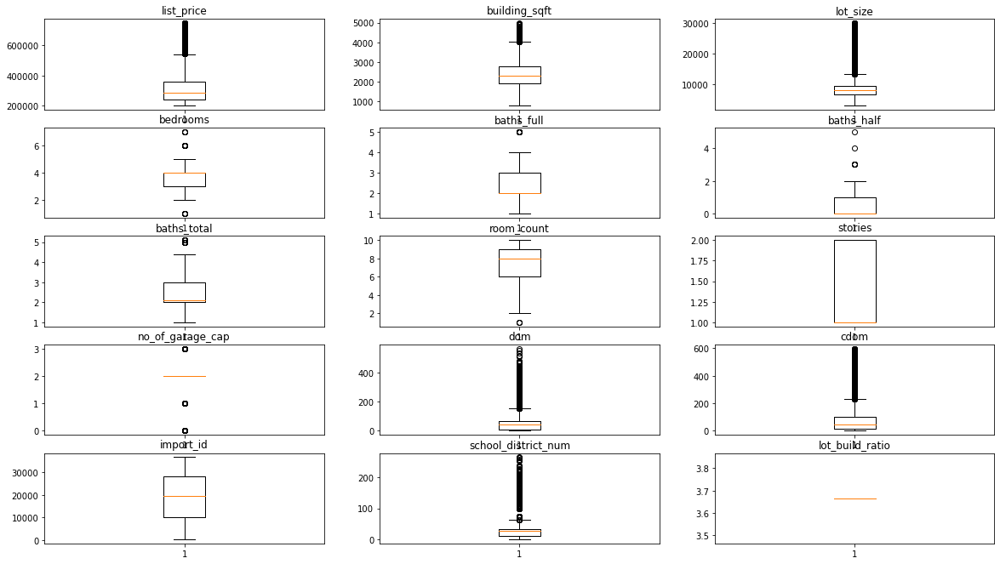

In [46]:
# Get all numerica columns
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']

df4_num = df4.select_dtypes(include=numerics)
col_names = df4_num.columns

# Eliminate unwanted elements
unwanted = {'close_price', 'new_construction', 'pool_private', 'ones', 'target', 'target_sum', 'target_rank'}
col_names = [ele for ele in col_names if ele not in unwanted]
                      
# Get a dict of numerial columns
col_dict = {c: i for i, c in enumerate(col_names, start=1)}

# Detect outliers in each variable using box plots.
plt.figure(figsize=(20,70))

for variable,i in col_dict.items():
                     plt.subplot(30,3,i)
                     plt.boxplot(df4[variable],whis=1.5)
                     plt.title(variable)
plt.show()

In [47]:
# Calculate number of outliers and its percentage in each variable using Tukey's method.
for variable in col_dict.keys():
    q75, q25 = np.percentile(df4[variable], [75 ,25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    col_length = len(np.where(df4[variable])[0])
    print("Number of outliers and percentage of it in {} : {} and {}".format(variable,
                                                len((np.where((df4[variable] > max_val) | (df4[variable] < min_val))[0])),
                                                len((np.where((df4[variable] > max_val) | (df4[variable] < min_val))[0]))*100/col_length))

Number of outliers and percentage of it in list_price : 570 and 5.697151424287856
Number of outliers and percentage of it in building_sqft : 177 and 1.7691154422788606
Number of outliers and percentage of it in lot_size : 773 and 7.726136931534233
Number of outliers and percentage of it in bedrooms : 29 and 0.2898550724637681
Number of outliers and percentage of it in baths_full : 17 and 0.16991504247876063
Number of outliers and percentage of it in baths_half : 7 and 0.14656616415410384
Number of outliers and percentage of it in baths_total : 17 and 0.16991504247876063
Number of outliers and percentage of it in room_count : 3 and 0.029985007496251874
Number of outliers and percentage of it in stories : 0 and 0.0
Number of outliers and percentage of it in no_of_garage_cap : 2166 and 22.831242753241277
Number of outliers and percentage of it in dom : 703 and 7.321391376796501
Number of outliers and percentage of it in cdom : 798 and 8.292632235269666
Number of outliers and percentage of

In [48]:
print('The shapes of dataset as we proceed: {}'.format(df4.shape))

The shapes of dataset as we proceed: (10005, 44)


In [49]:
# check to see if the unique index is duplicated. A duplication cause problem later
move_to_left_get_dup(df4, 'import_id')

,import_id,target,property_type,status,street_number,street_name,city_location,zip_code,county,list_price,close_price,area,subdivision,market_area,school_district,school_elementary,school_middle,school_high,building_sqft,lot_size,year_built,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,style,dom,cdom,list_office_mlsid,list_office_name,list_agent_mlsid,list_agent_full_name,last_change_timestamp,list_date,school_district_num,ones,lot_build_ratio,target_sum,target_rank


## Winsorize outliers 

In [50]:
# Get all numerica columns
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']

df4_num = df4.select_dtypes(include=numerics)
col_names = df4_num.columns

# Eliminate unwanted elements
unwanted = {'close_price', 'new_construction', 'pool_private', 'ones', 'target', 'target_sum', 'target_rank'}
col_names = [ele for ele in col_names if ele not in unwanted]

# Define Winsorize funtion
def using_mstats(s):
    return winsorize(s, limits=[0.01, 0.01])


# Apply the function
#df4[col_names] = df4[col_names].apply(lambda x: winsorize(x, limits=[0.01, 0.01]))

limit = 0.1
df4['no_of_garage_cap'] = winsorize(df4['no_of_garage_cap'], limits=limit)

In [51]:
print('The shapes of dataset as we proceed: {}'.format(df4.shape))

The shapes of dataset as we proceed: (10005, 44)


In [52]:
move_to_left_get_dup(df4, 'import_id')

,import_id,target,property_type,status,street_number,street_name,city_location,zip_code,county,list_price,close_price,area,subdivision,market_area,school_district,school_elementary,school_middle,school_high,building_sqft,lot_size,year_built,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,style,dom,cdom,list_office_mlsid,list_office_name,list_agent_mlsid,list_agent_full_name,last_change_timestamp,list_date,school_district_num,ones,lot_build_ratio,target_sum,target_rank


## Copy to new dataframe 

In [53]:
df5 = df4.copy()
print('The shapes of dataset as we proceed: {}, {}, {}, {}'.format(df0.shape, df1.shape, df4.shape, df5.shape))

The shapes of dataset as we proceed: (19429, 39), (13882, 42), (10005, 44), (10005, 44)


## Perform simple regression for predicting the listing price 

In [54]:
describe_with_nulls(df5)

,close_price
count,11162
mean,187078
std,177411
min,210
25%,2000
50%,195000
75%,271400
max,2.2e+06
dtype,float64
size,10005


In [55]:
# Y is the target variable
Y = df5['list_price']
# X is the feature set which includes
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
print(numerics)
df5_num = df5.select_dtypes(include=numerics)
print(df5_num.shape)
X = df5_num.drop(['list_price', 'close_price', 'target'], axis=1)


# We create a LinearRegression model object
# from scikit-learn's linear_model module.
lrm = linear_model.LinearRegression()

# fit method estimates the coefficients using OLS
lrm.fit(X, Y)

# Inspect the results.
print('\nCoefficients: \n', lrm.coef_)
print('\nIntercept: \n', lrm.intercept_)

['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
(10005, 22)

Coefficients: 
 [ 6.99106975e+01  6.37270596e-01 -4.32084720e+04  2.10671447e+04
  1.10063683e+04  2.21677816e+04 -1.68174135e+01 -2.20600771e+04
 -1.35703893e+03  3.50868284e+04  2.92064341e+04  9.36161115e+01
  3.24652709e+01  7.15834812e-02  3.76369293e+01  7.27595761e-12
 -2.10549537e-23 -2.48886586e+02 -2.30808710e+02]

Intercept: 
 155957.31588045388


# Gauss-Markov Theorem

## According to the Gauss–Markov theorem, in a linear regression model the ordinary least squares (OLS) estimator gives the best linear unbiased estimator (BLUE) of the coefficients, provided that

### Target variable should be a linear function of the model's coefficients
### The expectation of errors (residuals) is 0
### The errors have equal variance — homoscedasticity of errors
### Features should have low multicollinearity
### The errors are uncorrelated
### The explanatory variables and errors should be independent (exogeneity)


## Check for linearity

### The way we have specified our model here supports the linearity assumption

## Check assumption that error term should be zero on average¶

In [56]:
predictions = lrm.predict(X)
errors = Y - predictions

print("Mean of the errors in the target model is: {}".format(np.mean(errors)))

Mean of the errors in the target model is: -8.715150029822506e-12


### Since we have a constant term in the model, the average of the model's error is effectively zero.

## Check for the homoscedasticity assumption

## A model is homoscedastic when the distribution of its error terms (known as "scedasticity") is consistent for all predicted values. In other words, the error variance shouldn't systematically change across observations. 

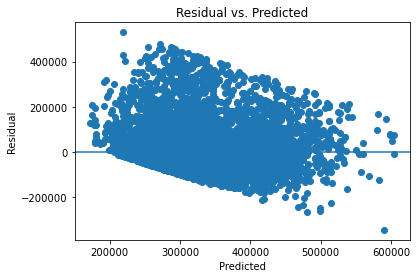

In [57]:
plt.scatter(predictions, errors)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0)
plt.title('Residual vs. Predicted')
plt.show()

### We can see that our error terms are not consistently distributed. 

### There are several formal statistical tests that we can use to determine whether there is heteroscedasticity in the error terms. Two of these are Barlett and Levene

### Perform Barlett and Levene tests

In [58]:
from scipy.stats import bartlett
from scipy.stats import levene

bart_stats = bartlett(predictions, errors)
lev_stats = levene(predictions, errors)

print("Bartlett test statistic value is {0:3g} and p value is {1:.3g}".format(bart_stats[0], bart_stats[1]))
print("Levene test statistic value is {0:3g} and p value is {1:.3g}".format(lev_stats[0], lev_stats[1]))

Bartlett test statistic value is 1605.83 and p value is 0
Levene test statistic value is 236.54 and p value is 4.5e-53


### The p-values of both tests is meaning we can reject the null hypothesis which again means our errors are hetetroscedastic.

## Check for low multicollinearity

### Individual features should be only weakly correlated with one another, and ideally completely uncorrelated. When features are correlated, they may both explain the same pattern of variance in the outcome. The model will attempt to find a solution, potentially by attributing half the explanatory power to one feature and half to the other. This isn’t a problem if our only goal is prediction, because then all that matters is that the variance gets explained. However, if we want to know which features matter most when predicting an outcome, multicollinearity can cause us to underestimate the relationship between features and outcomes.

#### We can simply use correlation matrix of the features to discover any multicollinearity

In [59]:
corr = X.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

,building_sqft,lot_size,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,dom,cdom,import_id,school_district_num,ones,lot_build_ratio,target_sum,target_rank
building_sqft,1.000000,0.206298,0.580728,0.644027,0.475826,0.679116,0.352726,0.491165,-0.112809,0.210741,0.397344,0.041121,0.074877,0.031004,-0.069596,nan,0.000000,0.015639,-0.016913
lot_size,0.206298,1.000000,0.079213,0.125049,0.034518,0.126595,0.035116,-0.067870,-0.113709,0.166190,0.192030,0.030163,0.034542,0.001861,0.163107,nan,-0.000000,-0.030274,0.040833
bedrooms,0.580728,0.079213,1.000000,0.514731,0.273474,0.533053,0.261430,0.420682,0.025678,0.101051,0.170642,0.008612,0.016623,0.017387,-0.066172,nan,-0.000000,0.024146,-0.031655
baths_full,0.644027,0.125049,0.514731,1.000000,0.094978,0.995888,0.196940,0.312349,0.109675,0.077637,0.348624,0.064506,0.084148,0.026435,-0.037678,nan,-0.000000,0.010353,-0.005945
baths_half,0.475826,0.034518,0.273474,0.094978,1.000000,0.184774,0.204036,0.603786,-0.071449,0.132227,0.145225,0.012597,0.030932,0.003583,-0.057521,nan,0.000000,0.028718,-0.018593
baths_total,0.679116,0.126595,0.533053,0.995888,0.184774,1.000000,0.212997,0.363314,0.101774,0.088681,0.357393,0.064829,0.085890,0.026424,-0.042432,nan,-0.000000,0.012834,-0.007561
room_count,0.352726,0.035116,0.261430,0.196940,0.204036,0.212997,1.000000,0.196358,-0.077605,0.096418,0.120528,-0.030952,-0.011311,0.003627,-0.105451,nan,0.000000,-0.002367,0.006900
stories,0.491165,-0.067870,0.420682,0.312349,0.603786,0.363314,0.196358,1.000000,-0.038569,0.099580,0.054508,0.026121,0.044412,0.010537,-0.058583,nan,-0.000000,0.019613,-0.023118
new_construction,-0.112809,-0.113709,0.025678,0.109675,-0.071449,0.101774,-0.077605,-0.038569,1.000000,-0.193955,0.073776,0.102293,0.049373,-0.032282,0.018985,nan,-0.000000,0.007804,0.001599
pool_private,0.210741,0.166190,0.101051,0.077637,0.132227,0.088681,0.096418,0.099580,-0.193955,1.000000,0.074902,-0.069627,-0.054981,0.013225,-0.015577,nan,0.000000,0.007275,-0.010977


## Several coefficients are correlated 

## Check if error terms are uncorrelated as they should be 

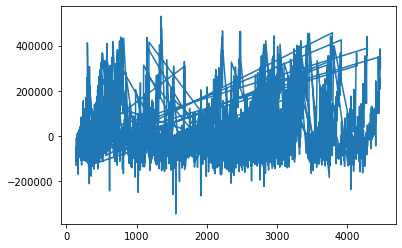

In [60]:
plt.plot(errors)
plt.show()

### Another option is to check the autocorrelation function. 

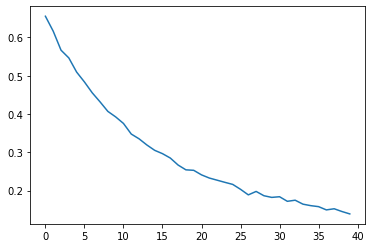

In [61]:
from statsmodels.tsa.stattools import acf

acf_data = acf(errors)

plt.plot(acf_data[1:])
plt.show()

### We have high multicollinearity not supporting the OLS assumptions

## Check if the features are correlated with the errors. A high correlation violates the OLS assumption (exogeneity)

### This assumption, is arguably the most important one: explanatory variables and errors should be independent. If this assumption doesn't hold, then the model's predictions will be unreliable as the estimates of the coefficients would be biased. This assumption is known as the exogeneity.

In [62]:
# Convert errors to series
error_series = pd.Series(errors)
X_copy = X.copy()
X_copy['errors'] = error_series
corr = X_copy.corr()
corr.style.background_gradient(cmap='BuPu')
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

,building_sqft,lot_size,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,dom,cdom,import_id,school_district_num,ones,lot_build_ratio,target_sum,target_rank,errors
building_sqft,1.000000,0.206298,0.580728,0.644027,0.475826,0.679116,0.352726,0.491165,-0.112809,0.210741,0.397344,0.041121,0.074877,0.031004,-0.069596,nan,0.000000,0.015639,-0.016913,-0.000000
lot_size,0.206298,1.000000,0.079213,0.125049,0.034518,0.126595,0.035116,-0.067870,-0.113709,0.166190,0.192030,0.030163,0.034542,0.001861,0.163107,nan,-0.000000,-0.030274,0.040833,0.000000
bedrooms,0.580728,0.079213,1.000000,0.514731,0.273474,0.533053,0.261430,0.420682,0.025678,0.101051,0.170642,0.008612,0.016623,0.017387,-0.066172,nan,-0.000000,0.024146,-0.031655,-0.000000
baths_full,0.644027,0.125049,0.514731,1.000000,0.094978,0.995888,0.196940,0.312349,0.109675,0.077637,0.348624,0.064506,0.084148,0.026435,-0.037678,nan,-0.000000,0.010353,-0.005945,-0.000000
baths_half,0.475826,0.034518,0.273474,0.094978,1.000000,0.184774,0.204036,0.603786,-0.071449,0.132227,0.145225,0.012597,0.030932,0.003583,-0.057521,nan,0.000000,0.028718,-0.018593,-0.000000
baths_total,0.679116,0.126595,0.533053,0.995888,0.184774,1.000000,0.212997,0.363314,0.101774,0.088681,0.357393,0.064829,0.085890,0.026424,-0.042432,nan,-0.000000,0.012834,-0.007561,-0.000000
room_count,0.352726,0.035116,0.261430,0.196940,0.204036,0.212997,1.000000,0.196358,-0.077605,0.096418,0.120528,-0.030952,-0.011311,0.003627,-0.105451,nan,0.000000,-0.002367,0.006900,-0.000000
stories,0.491165,-0.067870,0.420682,0.312349,0.603786,0.363314,0.196358,1.000000,-0.038569,0.099580,0.054508,0.026121,0.044412,0.010537,-0.058583,nan,-0.000000,0.019613,-0.023118,-0.000000
new_construction,-0.112809,-0.113709,0.025678,0.109675,-0.071449,0.101774,-0.077605,-0.038569,1.000000,-0.193955,0.073776,0.102293,0.049373,-0.032282,0.018985,nan,-0.000000,0.007804,0.001599,-0.000000
pool_private,0.210741,0.166190,0.101051,0.077637,0.132227,0.088681,0.096418,0.099580,-0.193955,1.000000,0.074902,-0.069627,-0.054981,0.013225,-0.015577,nan,0.000000,0.007275,-0.010977,0.000000


## Normality of residuals

### When this assumption is violated, it causes problems with calculating confidence intervals and various significance tests for coefficients. When the error distribution significantly departs from Gaussian, confidence intervals may be too wide or too narrow. Although it is not an assumption of OLS, it still can impact our results. Specifically, normality of errors is not required to apply OLS to a linear regression model, but in order to measure the statistical significance of our estimated coefficients, error terms must be normally distributed. 

###  An informal way of doing this is by visualizing the errors in a QQ plot or to look at the histogram:

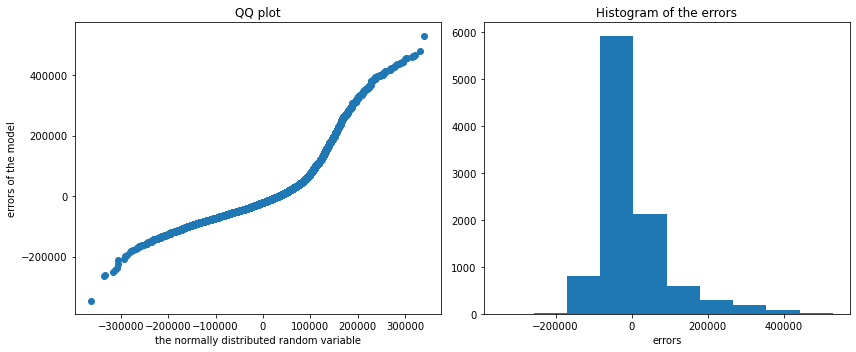

In [63]:
rand_nums = np.random.normal(np.mean(errors), np.std(errors), len(errors))

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.scatter(np.sort(rand_nums), np.sort(errors)) # we sort the arrays
plt.xlabel("the normally distributed random variable")
plt.ylabel("errors of the model")
plt.title("QQ plot")

plt.subplot(1,2,2)
plt.hist(errors)
plt.xlabel("errors")
plt.title("Histogram of the errors")

plt.tight_layout()
plt.show()

### Above shows that our erros are almost normally distributed.

### Perform Jargue Berra and normals tests

In [64]:
from scipy.stats import jarque_bera
from scipy.stats import normaltest

In [65]:
jb_stats = jarque_bera(errors)
norm_stats = normaltest(errors)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

Jarque-Bera test statistics is 16408.04975519981 and p value is 0.0
Normality test statistics is 3937.8214616888345 and p value is 0.0


### The p-values of both tests are zero indicating that our errors are normally distributed.

In [66]:
# Y is the target variable
Y = df5['list_price']
# X is the feature set which includes
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
print(numerics)
df5_num = df5.select_dtypes(include=numerics)
print(df5_num.shape)
X = df5_num.drop(['list_price', 'close_price', 'target'], axis=1)
X = sm.add_constant(X)
# We fit an OLS model using statsmodels
results = sm.OLS(Y, X).fit()
print(results.summary())

['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
(10005, 22)
                            OLS Regression Results                            
Dep. Variable:             list_price   R-squared:                       0.307
Model:                            OLS   Adj. R-squared:                  0.306
Method:                 Least Squares   F-statistic:                     277.1
Date:                Fri, 19 Feb 2021   Prob (F-statistic):               0.00
Time:                        21:13:07   Log-Likelihood:            -1.2833e+05
No. Observations:               10005   AIC:                         2.567e+05
Df Residuals:                    9988   BIC:                         2.568e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------

### Most of the p-values of coefficients are close to zero indicating they are statistically significants. 

## Copy dataframe 

In [67]:
df6 = df5.copy()
print('The shapes of dataset as we proceed: {}, {}, {}, {}, {}'.format(df0.shape, df1.shape, df4.shape, df5.shape, df6.shape))

The shapes of dataset as we proceed: (19429, 39), (13882, 42), (10005, 44), (10005, 44), (10005, 44)


## Add dummy variables for some categorical data 

In [68]:
	cat_lst = [
    #
    #'street_name','city_location', 'style'\
    #'subdivision'
    #, 'market_area'\
    #,'school_district', 'school_elementary', 'school_middle', 'school_high', 
    #,'list_agent_mlsid' \
    #,'list_office_mlsid'\
    #'selling_office_mlsid', 'close_date', 'year_built' \
    #'zip_code'
    #'area'
    'county'
    ]		

In [69]:
dummies = pd.get_dummies(data= df6, columns=cat_lst)
df7 = dummies.copy()
print('The shapes of dataset as we proceed: {}, {}, {}, {}, {}, {}'.format(df0.shape, df1.shape, df4.shape, df5.shape, df6.shape, df7.shape))

The shapes of dataset as we proceed: (19429, 39), (13882, 42), (10005, 44), (10005, 44), (10005, 44), (10005, 102)


In [70]:
#df7[df7.duplicated('import_id')]

In [71]:
move_to_left_get_dup(df7, 'import_id')

,import_id,target,property_type,status,street_number,street_name,city_location,zip_code,list_price,close_price,area,subdivision,market_area,school_district,school_elementary,school_middle,school_high,building_sqft,lot_size,year_built,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,style,dom,cdom,list_office_mlsid,list_office_name,list_agent_mlsid,list_agent_full_name,last_change_timestamp,list_date,school_district_num,ones,lot_build_ratio,target_sum,target_rank,county_anderson,county_angelina,county_aransas,county_austin,county_bastrop,county_bell,county_bexar,...,county_brazos,county_burleson,county_burnet,county_calhoun,county_chambers,county_cherokee,county_collin,county_colorado,county_comal,county_dallas,county_fayette,county_fort bend,county_freestone,county_galveston,county_grimes,county_guadalupe,county_hardin,county_harris,county_hays,county_henderson,county_hidalgo,county_houston,county_jackson,county_jasper,county_jefferson,county_lavaca,county_leon,county_liberty,county_limestone,county_llano,county_madison,county_matagorda,county_milam,county_montgomery,county_orange,county_other,county_polk,county_robertson,county_san jacinto,county_smith,county_travis,county_trinity,county_tyler,county_victoria,county_walker,county_waller,county_washington,county_wharton,county_williamson,county_wood


In [72]:
describe(df6)

,target,list_price,close_price,building_sqft,lot_size,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,dom,cdom,import_id,school_district_num,ones,lot_build_ratio,target_sum,target_rank,property_type,status,street_number,street_name,city_location,zip_code,county,area,subdivision,market_area,school_district,school_elementary,school_middle,school_high,year_built,style,list_office_mlsid,list_office_name,list_agent_mlsid,list_agent_full_name,last_change_timestamp,list_date
count,10005.000000,10005.000000,5202.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.000000,10005.0,1.000500e+04,10005.000000,10005.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,0.186407,316478.804498,302366.216647,2389.113643,8629.415492,3.584208,2.320340,0.489055,2.369245,7.402999,1.452974,0.272264,0.093353,2.117541,54.989905,78.074863,19288.840980,30.113143,1.0,3.666057e+00,8.467966,19.863468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,0.389454,108207.580228,100043.796217,645.453802,3557.190335,0.643789,0.570001,0.525447,0.577366,2.065334,0.491392,0.445147,0.290941,0.322080,62.937570,94.878220,10422.098960,26.658581,0.0,9.326340e-14,14.164302,7.151384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,200000.000000,210.000000,800.000000,3000.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,247.000000,1.000000,1.0,3.666057e+00,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,0.000000,238750.000000,230000.000000,1915.000000,6667.000000,3.000000,2.000000,0.000000,2.000000,6.000000,1.000000,0.000000,0.000000,2.000000,11.000000,13.000000,10232.000000,13.000000,1.0,3.666057e+00,1.000000,17.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,0.000000,283300.000000,272500.000000,2318.000000,8014.000000,4.000000,2.000000,0.000000,2.100000,8.000000,1.000000,0.000000,0.000000,2.000000,42.000000,49.000000,19600.000000,27.000000,1.0,3.666057e+00,3.000000,23.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,0.000000,359900.000000,343000.000000,2758.000000,9302.000000,4.000000,3.000000,1.000000,3.000000,9.000000,2.000000,1.000000,0.000000,2.000000,68.000000,100.000000,28244.000000,33.000000,1.0,3.666057e+00,9.000000,25.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,1.000000,750000.000000,750000.000000,4974.000000,30000.000000,7.000000,5.000000,5.000000,5.100000,10.000000,2.000000,1.000000,1.000000,3.000000,565.000000,598.000000,36860.000000,264.000000,1.0,3.666057e+00,68.000000,26.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean abs dev,0.303319,81585.233933,74524.751168,510.784324,2265.734537,0.572775,0.481608,0.511199,0.486612,1.720531,0.484077,0.396273,0.169277,0.207451,42.068260,66.476585,9019.988662,14.990872,0.0,9.325873e-14,8.970009,5.695452,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
skew,1.610747,1.596984,1.685531,0.621094,2.477810,0.104614,1.074603,0.393051,1.051693,-0.591970,0.188923,1.023399,2.795944,2.375404,2.565710,2.224165,-0.066042,3.629271,0.0,0.000000e+00,2.825721,-1.267589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [73]:
print('The shapes of dataset as we proceed: {}, {}, {}, {}, {}, {}'.format(df0.shape, df1.shape, df4.shape, df5.shape, df6.shape, df7.shape))

The shapes of dataset as we proceed: (19429, 39), (13882, 42), (10005, 44), (10005, 44), (10005, 44), (10005, 102)


In [74]:
pivot2 = pd.pivot_table(df7,index=["target","zip_code"],aggfunc=[len], margins=True).round(0)

#pivot2.columns
#pivot2.sort_values(by=('len', 'target'), ascending=False)
#pivot2

In [75]:
# Y is the target variable
Y = df7['list_price']

# X is the feature set which includes
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df7_num = df7.select_dtypes(include=numerics)
X = df7_num.drop(['list_price', 'close_price', 'target'], axis=1)

In [76]:
#new_X = pd.DataFrame(mca.transform(X), columns=['mca%i' % i for i in range(n_components)], index=df7.index)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)
print("df7.shape:{}, X.shape:{}, Y.shape:{}, X_train.shape:{}, X_test.shape:{}, y_train.shape:{}, y_test.shape{}".format(df7.shape, X.shape, Y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape))

df7.shape:(10005, 102), X.shape:(10005, 78), Y.shape:(10005,), X_train.shape:(8004, 78), X_test.shape:(2001, 78), y_train.shape:(8004,), y_test.shape(2001,)


## Ridge regression  

In [77]:
alphas = np.array([1000000, 1000, 10,  1, 0.1, 0.01, 0.001])
model = Ridge(fit_intercept = True)
grid = GridSearchCV(estimator=model, cv = 5, param_grid=dict(alpha=alphas))
grid.fit(X_train, y_train)
print(grid)
print(grid.best_score_)
print(grid.best_estimator_.alpha)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([1.e+06, 1.e+03, 1.e+01, 1.e+00, 1.e-01, 1.e-02, 1.e-03])})
0.3213441714270667
1.0


In [78]:
# Run the Ridge
regression = Ridge(alpha=1)
regression.fit(X_train, y_train)
y_pred = regression.predict(X_test)

In [79]:
# Print the regression result performance
print("--------------Ridge--------------------")
print("------- Number of Observation ---------")
print("The number of observations in training set is {}".format(X_train.shape[0]))
print("The number of observations in test set is {}".format(X_test.shape[0]))
print("----------------------------------------")
print("----- Performance on training data -----")
regression.fit(X_train, y_train)
y_pred = regression.predict(X_train)
regression_results(y_train, y_pred)
print("----------------------------------------")
print("----- Performance on test data -----")
regression.fit(X_train, y_train)
y_pred = regression.predict(X_test)
regression_results(y_test, y_pred)
print("----------------------------------------")
print("----- Coefficients and intercept data -----")
print(regression.coef_)
#print(regression.intercept_)

--------------Ridge--------------------
------- Number of Observation ---------
The number of observations in training set is 8004
The number of observations in test set is 2001
----------------------------------------
----- Performance on training data -----
explained_variance:  0.3305
mean_squared_log_error:  0.0586
r2:  0.3305
MAE:  61254.8841
MSE:  7861979394.9618
RMSE:  88667.8036
----------------------------------------
----- Performance on test data -----
explained_variance:  0.327
mean_squared_log_error:  0.0585
r2:  0.3269
MAE:  61121.6785
MSE:  7782453283.2572
RMSE:  88218.214
----------------------------------------
----- Coefficients and intercept data -----
[ 7.37411373e+01  8.72406309e-01 -4.37866970e+04  2.21624897e+04
  1.02593984e+04  2.31884295e+04 -3.85224654e+02 -2.47093836e+04
  3.26205024e+03  3.36766049e+04  2.63227085e+04  1.02936141e+02
  2.34378250e+01 -2.10224243e-02  2.15195151e+02  0.00000000e+00
  2.29335567e-22 -2.07078757e+02 -1.33455004e+02 -7.70902474e

## Lasso regression  

In [80]:
alphas = np.array([1000000, 100000, 1000, 1, 0.1, 0.01, 0.001])
model = Lasso(fit_intercept = True)
grid = GridSearchCV(estimator=model, cv=5, param_grid=dict(alpha=alphas))
grid.fit(X_train, y_train)
print(grid)
print(grid.best_score_)
print(grid.best_estimator_.alpha)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([1.e+06, 1.e+05, 1.e+03, 1.e+00, 1.e-01, 1.e-02, 1.e-03])})
0.3208624651496623
1.0


In [81]:
# Run the Lasso
regression = Lasso(alpha=1)
regression.fit(X_train, y_train)
y_pred = regression.predict(X_test)

In [82]:
# Print the regression result performance
print("-------------Lasso----------------------")
print("------- Number of Observation ---------")
print("The number of observations in training set is {}".format(X_train.shape[0]))
print("The number of observations in test set is {}".format(X_test.shape[0]))
print("----------------------------------------")
print("----- Performance on training data -----")
regression.fit(X_train, y_train)
y_pred = regression.predict(X_train)
regression_results(y_train, y_pred)
print("----------------------------------------")
print("----- Performance on test data -----")
regression.fit(X_train, y_train)
y_pred = regression.predict(X_test)
regression_results(y_test, y_pred)
print("----------------------------------------")
print("----- Coefficients and intercept data -----")
print(regression.coef_)
print(regression.intercept_)

-------------Lasso----------------------
------- Number of Observation ---------
The number of observations in training set is 8004
The number of observations in test set is 2001
----------------------------------------
----- Performance on training data -----
explained_variance:  0.3315
mean_squared_log_error:  0.0585
r2:  0.3315
MAE:  61144.5212
MSE:  7850031971.3956
RMSE:  88600.4062
----------------------------------------
----- Performance on test data -----
explained_variance:  0.3267
mean_squared_log_error:  0.0586
r2:  0.3267
MAE:  61143.4306
MSE:  7785470447.1853
RMSE:  88235.3129
----------------------------------------
----- Coefficients and intercept data -----
[ 7.38305578e+01  8.81465560e-01 -4.36296134e+04  4.50630233e+04
  1.27917166e+04  2.48525937e+02 -4.03336199e+02 -2.51654105e+04
  3.32840292e+03  3.38092547e+04  2.62154624e+04  1.03455016e+02
  2.36499262e+01 -2.49056995e-02  2.23953576e+02  0.00000000e+00
  0.00000000e+00 -2.11866299e+02 -1.47441734e+02 -1.392830

## ElasticNet regression  

In [83]:
#alphas = np.array([1000000, 100000, 1000, 1, 0.1, 0.01, 0.001])
param_grid = {"max_iter": [1, 5, 10], "alpha":[1000000, 100000, 1000, 1, 0.1, 0.01, 0.001], "l1_ratio": np.arange(0.0, 1.0, 0.1)}

model = ElasticNet(fit_intercept = True)
grid = GridSearchCV(estimator=model, cv = 5, param_grid=param_grid)#) #dict(alpha=alphas))
grid.fit(X_train, y_train)
print(grid)
print(grid.best_score_)
print(grid.best_estimator_.max_iter)
print(grid.best_estimator_.alpha)
print(grid.best_estimator_.l1_ratio)

GridSearchCV(cv=5, estimator=ElasticNet(),
             param_grid={'alpha': [1000000, 100000, 1000, 1, 0.1, 0.01, 0.001],
                         'l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_iter': [1, 5, 10]})
0.3216786078059756
5
0.001
0.7000000000000001


In [84]:
# Run the ElasticNet
regression = ElasticNet(max_iter=5, alpha=0.001, l1_ratio=0.7)
regression.fit(X_train, y_train)
y_pred = regression.predict(X_test)

In [85]:
# Print the regression result performance
print("-----------ElasticNet------------------")
print("------- Number of Observation ---------")
print("The number of observations in training set is {}".format(X_train.shape[0]))
print("The number of observations in test set is {}".format(X_test.shape[0]))
print("----------------------------------------")
print("----- Performance on training data -----")
regression.fit(X_train, y_train)
y_pred = regression.predict(X_train)
regression_results(y_train, y_pred)
print("----------------------------------------")
print("----- Performance on test data -----")
regression.fit(X_train, y_train)
y_pred = regression.predict(X_test)
regression_results(y_test, y_pred)
print("----------------------------------------")
print("----- Coefficients and intercept data -----")
#print(regression.coef_)
#print(regression.intercept_)

-----------ElasticNet------------------
------- Number of Observation ---------
The number of observations in training set is 8004
The number of observations in test set is 2001
----------------------------------------
----- Performance on training data -----
explained_variance:  0.3291
mean_squared_log_error:  0.0587
r2:  0.3291
MAE:  61271.4779
MSE:  7877938932.2197
RMSE:  88757.7542
----------------------------------------
----- Performance on test data -----
explained_variance:  0.3261
mean_squared_log_error:  0.0585
r2:  0.3261
MAE:  61062.2278
MSE:  7792255538.194
RMSE:  88273.7534
----------------------------------------
----- Coefficients and intercept data -----


## Random Forest Regressor

In [86]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 2)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 50, num = 2)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

{'n_estimators': [200, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 50, None], 'min_samples_split': [2, 5], 'min_samples_leaf': [1, 2], 'bootstrap': [True, False]}


In [87]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rfr = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
rf_random = RandomizedSearchCV(estimator = rfr, param_distributions = random_grid, n_iter = 1, cv = 3, verbose=2, random_state=42, n_jobs = 8 )#-1 means all cores are used)
#Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 1 candidates, totalling 3 fits
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   3 out of   3 | elapsed:   13.5s finished


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=1, n_jobs=8,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 50, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [200, 2000]},
                   random_state=42, verbose=2)

In [88]:
rf_random.best_params_

{'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': None,
 'bootstrap': False}

In [89]:
# To determine if random search yielded a better model, we compare the base model with the best random search model.
def evaluate(model, X_test, y_test):
    predictions = model.predict(X_test)
    print(predictions.shape)
    y_test = y_test.values
    errors = abs(predictions - y_test)
    mape = 100 * np.mean(errors / y_test)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

(2001,)
Model Performance
Average Error: 46861.7858 degrees.
Accuracy = 85.57%.


In [90]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, X_test, y_test)

(2001,)
Model Performance
Average Error: 57539.6489 degrees.
Accuracy = 82.44%.


In [91]:
print('Improvement of {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))

Improvement of -3.66%.


## Random search allowed us to narrow down the range for each hyperparameter. Now that we know where to concentrate our search, we can explicitly specify every combination of settings to try. 

In [92]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 100, 120],
    'max_features': ['auto'],
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [2, 4, 8],
    'n_estimators': [1200, 1400, 1600]
}
# Create a based model
rfr = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rfr, param_grid = param_grid, 
                          cv = 3, n_jobs = 5, verbose = 2)
# Fit the grid search to the data
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:  5.2min
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed: 21.6min
[Parallel(n_jobs=5)]: Done 243 out of 243 | elapsed: 34.1min finished


{'bootstrap': True,
 'max_depth': 100,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 1400}

In [93]:
best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, X_test, y_test)

(2001,)
Model Performance
Average Error: 44273.1616 degrees.
Accuracy = 86.35%.


In [94]:
print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))

Improvement of 0.92%.


## It seems we have about maxed out performance

## All the models perform poorly. This require additional feature engineering 

## Pick one of fitted model for market price prediction

In [95]:
# Run the Ridge
ridge_regression = Ridge(alpha=1)
ridge_regression.fit(X_train, y_train)
y_pred = ridge_regression.predict(X)

# Create temporary pandas to combine (left join) original dataset with new market price prediction
X1 = X.copy()
X1['value_predicted'] = y_pred
X1.drop(X1.columns.difference(['import_id','value_predicted']), 1, inplace=True)
df8 = pd.merge(left=df7, right=X1, how='left', left_on='import_id', right_on='import_id')
print("df7.shape: {}, df8.shape: {}, y_pred.shape:{}, X_train.shape:{}, y_train.shape:{}".format(df7.shape, df8.shape, y_pred.shape, X_train.shape, y_train.shape))
del X1

df7.shape: (10005, 102), df8.shape: (10005, 103), y_pred.shape:(10005,), X_train.shape:(8004, 78), y_train.shape:(8004,)


In [96]:
move_to_left_get_dup(df8, 'import_id')

,import_id,target,property_type,status,street_number,street_name,city_location,zip_code,list_price,close_price,area,subdivision,market_area,school_district,school_elementary,school_middle,school_high,building_sqft,lot_size,year_built,bedrooms,baths_full,baths_half,baths_total,room_count,stories,new_construction,pool_private,no_of_garage_cap,style,dom,cdom,list_office_mlsid,list_office_name,list_agent_mlsid,list_agent_full_name,last_change_timestamp,list_date,school_district_num,ones,lot_build_ratio,target_sum,target_rank,county_anderson,county_angelina,county_aransas,county_austin,county_bastrop,county_bell,county_bexar,...,county_burleson,county_burnet,county_calhoun,county_chambers,county_cherokee,county_collin,county_colorado,county_comal,county_dallas,county_fayette,county_fort bend,county_freestone,county_galveston,county_grimes,county_guadalupe,county_hardin,county_harris,county_hays,county_henderson,county_hidalgo,county_houston,county_jackson,county_jasper,county_jefferson,county_lavaca,county_leon,county_liberty,county_limestone,county_llano,county_madison,county_matagorda,county_milam,county_montgomery,county_orange,county_other,county_polk,county_robertson,county_san jacinto,county_smith,county_travis,county_trinity,county_tyler,county_victoria,county_walker,county_waller,county_washington,county_wharton,county_williamson,county_wood,value_predicted


In [97]:
def get_distict_count(df, col_name):
    #df_empty = pd.DataFrame({'A' : []})
    df_empty = df.groupby([col_name]).size()
    return df_empty

In [98]:
 # Calculate how much listing price deviates from the expected value

df8['value_price_delta'] = df8['value_predicted'] - df8['list_price']
df8['value_price_delta_percent'] = (df8['value_price_delta']/df8['list_price'])*100 
df8['value_price_delta_percent'] = df8['value_price_delta_percent']#a.astype(int)

In [99]:
numerics = ['int_', 'int8', 'uint8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df8_num = df8.select_dtypes(include=numerics)
df8_num.columns
Y = df8['target']
X = df8_num.drop(['target', 'close_price'], axis=1)

## Check the ballance of the target features

In [100]:
df8.shape, X.shape, y_train.shape

((10005, 105), (10005, 82), (8004,))

In [101]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.35, random_state = 465)
print("X.shape:{}, Y.shape:{}, X_train.shape:{}, X_test.shape:{}, y_train.shape:{}, y_test.shape{}".format(X.shape, Y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape))

X.shape:(10005, 82), Y.shape:(10005,), X_train.shape:(6503, 82), X_test.shape:(3502, 82), y_train.shape:(6503,), y_test.shape(3502,)


In [103]:
# Standardize
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [104]:
# Set up Support Vector Model Pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC

svm_clf = Pipeline([
        ("scaler", StandardScaler()),
        ("linear_svc", LinearSVC(C=1, loss="hinge")),
    ])

svm_clf.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('linear_svc', LinearSVC(C=1, loss='hinge'))])

In [105]:
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

pca = PCA(n_components=None, svd_solver='randomized', whiten=True, random_state=42)
svc = SVC(kernel='rbf', class_weight='balanced')
model = make_pipeline(pca, svc)

In [106]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.35, random_state = 465)


In [107]:
from sklearn.model_selection import GridSearchCV
param_grid = {'svc__C': [1, 5, 10, 50],
              'svc__gamma': [0.0001, 0.0005, 0.001, 0.005]}
grid = GridSearchCV(model, param_grid)

%time grid.fit(X_train, y_train)
print(grid.best_params_)

Wall time: 4min 9s
{'svc__C': 1, 'svc__gamma': 0.0005}


In [108]:
model = grid.best_estimator_
yfit = model.predict(X_test)

In [109]:
from sklearn.metrics import classification_report
print(classification_report(y_test, yfit))#)                           

              precision    recall  f1-score   support

           0       0.81      1.00      0.90      2844
           1       0.33      0.00      0.00       658

    accuracy                           0.81      3502
   macro avg       0.57      0.50      0.45      3502
weighted avg       0.72      0.81      0.73      3502



## As expected this classification performed poorly because of limited use of features. Because of high cardinality of categorical features in this dataset one should use Dask or Spark to gain efficiency in running these algorithms.